In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Unzip and load file data file onto server, then delete zip file for optimizing performance
zip_path = "drive/MyDrive/nature_12K.zip"
!cp "{zip_path}" .
!unzip -qn nature_12K.zip
!rm nature_12K.zip

In [ ]:
import numpy
import os
import wandb
import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, random_split
import matplotlib.pyplot as plt

In [ ]:
# Define the CNN Model
class CNNClassifier(nn.Module):
    def __init__(self, num_filters=32, filter_multiplier=1, dropout=0.2, batch_norm=False, dense_size=64, num_classes=10,activation='relu'):
        super(CNNClassifier, self).__init__()


        self.activation = {
            'relu': nn.ReLU(),
            'silu': nn.SiLU(),
            'gelu': nn.GELU(),
            'mish': nn.Mish()
        }[activation.lower()]


        self.conv_layers = nn.ModuleList()
        in_channels = 3  # RGB Images

        for i in range(5):
            out_channels = num_filters
            conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
            self.conv_layers.append(conv_layer)

            if batch_norm:
                self.conv_layers.append(nn.BatchNorm2d(out_channels))

            self.conv_layers.append(self.activation)
            self.conv_layers.append(nn.MaxPool2d(kernel_size=2, stride=2))

            in_channels = out_channels
            num_filters = int(num_filters * filter_multiplier)


        self.fc1 = nn.Linear(in_channels * 8 * 8, dense_size)

        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(dense_size, num_classes)


    def forward(self, x):
        for layer in self.conv_layers:
            x = layer(x)

        x = torch.flatten(x, start_dim=1)

    # Get the dynamic input size for fc1
        if not hasattr(self, 'fc1'):
            self.fc1 = nn.Linear(x.shape[1], self.dense_size).to(x.device)

        x = self.fc1(x)
        x = self.dropout(x)
        x = nn.ReLU()(x)
        x = self.fc2(x)
        return x

# Dataset Preparation
def prepare_dataset(data_dir="inaturalist_12K", augment_data=False, batch_size=256):
    train_dir = os.path.join(data_dir, "train")
    test_dir = os.path.join(data_dir, "val")

    transform_train = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize all images to 256x256
        transforms.RandomRotation(30) if augment_data else transforms.Lambda(lambda x: x),
        transforms.RandomHorizontalFlip() if augment_data else transforms.Lambda(lambda x: x),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
])

    transform_test = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize all images to 256x256
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
])


    train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
    test_dataset = datasets.ImageFolder(test_dir, transform=transform_test)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader



# Train function
def train():
    config_defaults = {
        "num_filters": 32,
        "filter_multiplier": 2,
        "augment_data": False,
        "dropout": 0.3,
        "batch_norm": False,
        "epochs": 50,
        "dense_size": 64,
        "lr": 0.001,
        "activation": "relu",
        "optimizer": "adam"
    }

    wandb.init(project="CNN-Hyperparam-Tuning", config=config_defaults)
    config = wandb.config
    wandb.run.name = set_run_name(config.num_filters, config.filter_multiplier, config.augment_data, config.dropout, config.batch_norm,config.optimizer)

    # Prepare dataset
    train_loader, val_loader, _ = prepare_dataset(augment_data=config.augment_data)

    # Define model, loss function, optimizer
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = CNNClassifier(
        num_filters=config.num_filters,
        filter_multiplier=config.filter_multiplier,
        dropout=config.dropout,
        batch_norm=config.batch_norm,
        dense_size=config.dense_size
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    # optimizer = optim.Adam(model.parameters(), lr=config.lr)

    # if config.optimizer == 'adam':
    #     optimizer = optim.Adam(model.parameters(), lr=config.lr)
    # elif config.optimizer == 'sgd':
    #     optimizer = optim.SGD(model.parameters(), lr=config.lr, momentum=0.9)
    # else:
    #     raise ValueError(f"Unsupported optimizer: {config.optimizer}")
    if config.optimizer == 'adam':
        optimizer = optim.Adam(model.parameters(), lr=config.lr)
    elif config.optimizer == 'sgd':
        optimizer = optim.SGD(model.parameters(), lr=config.lr, momentum=0.9)
    elif config.optimizer == 'nadam':
        optimizer = optim.NAdam(model.parameters(), lr=config.lr)
    else:
        raise ValueError(f"Unsupported optimizer: {config.optimizer}")


    # Training Loop
    for epoch in range(config.epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        train_loss = running_loss / len(train_loader)
        train_accuracy = 100. * correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()

        val_loss /= len(val_loader)
        val_accuracy = 100. * val_correct / val_total

        # Log to WandB
        wandb.log({
            "epoch": epoch+1,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": val_loss,
            "val_accuracy": val_accuracy
        })

        print(f"Epoch {epoch+1}/{config.epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")

    print("Training Completed!")

# Function to create readable run names
def set_run_name(num_filters=32, filter_multiplier=1, augment_data=False, dropout=0.2, batch_norm=False, optimizer = "adam"):
    augment_data_options = {True: "Y", False: "N"}
    batch_norm_options = {True: "Y", False: "N"}
    return f"num_{num_filters}_org_{filter_multiplier}_aug_{augment_data_options[augment_data]}_drop_{dropout}_norm_{batch_norm_options[batch_norm]}_opt_{optimizer}"

sweep_config = {
    'Name': 'CNN-Hyperparam-Tuning',
    'method': 'bayes',
    'metric': {
        'name': 'val_accuracy',
        'goal': 'maximize'
    },
    'parameters': {
        'num_filters': {'values': [16, 32]},
        'filter_multiplier': {'values': [1, 2]},
        'augment_data': {'values': [False, True]},
        'dropout': {'values': [0.3, 0.5]},
        'batch_norm': {'values': [False, True]},
        'epochs': {'value': 3},
        'dense_size': {'values': [64, 128]},
        'activation': {'values': ['relu', 'silu', 'gelu', 'mish']},
        'lr': {'values': [0.001, 0.0001]},
        'optimizer': {'values': ['adam', 'nadam','sgd']}
    }
}
# Run training
if __name__ == "__main__":
    sweep_id = wandb.sweep(sweep_config, project="CNN-Hyperparam-Tuning", entity = 'ma23c044-indian-institute-of-technology-madras')
    wandb.agent(sweep_id, function=train, count=5)





wandb: WARNING Malformed sweep config detected! This may cause your sweep to behave in unexpected ways.
wandb: WARNING To avoid this, please fix the sweep config schema violations below:
wandb: WARNING   Violation 1. Additional properties are not allowed ('Name' was unexpected)


Create sweep with ID: urob7dwb
Sweep URL: https://wandb.ai/ma23c044-indian-institute-of-technology-madras/CNN-Hyperparam-Tuning/sweeps/urob7dwb


wandb: Agent Starting Run: 0mmwhokm with config:
wandb: 	activation: gelu
wandb: 	augment_data: False
wandb: 	batch_norm: True
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.001
wandb: 	num_filters: 32
wandb: 	optimizer: nadam


Epoch 1/3 - Train Loss: 2.1658, Train Acc: 20.97%, Val Loss: 2.1866, Val Acc: 18.00%
Epoch 2/3 - Train Loss: 2.0136, Train Acc: 27.53%, Val Loss: 2.1990, Val Acc: 22.50%
Epoch 3/3 - Train Loss: 1.9467, Train Acc: 30.46%, Val Loss: 2.4695, Val Acc: 23.90%
Training Completed!


epoch,▁▅█
train_accuracy,▁▆█
train_loss,█▃▁
val_accuracy,▁▆█
val_loss,▁▁█
epoch,3
train_accuracy,30.45894
train_loss,1.94667
val_accuracy,23.9
val_loss,2.46953


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 8m02jkvz with config:
wandb: 	activation: silu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.5
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.001
wandb: 	num_filters: 32
wandb: 	optimizer: nadam


Epoch 1/3 - Train Loss: 2.2930, Train Acc: 12.72%, Val Loss: 2.2699, Val Acc: 14.20%
Epoch 2/3 - Train Loss: 2.2609, Train Acc: 14.72%, Val Loss: 2.2292, Val Acc: 15.60%
Epoch 3/3 - Train Loss: 2.2248, Train Acc: 17.27%, Val Loss: 2.2382, Val Acc: 16.20%
Training Completed!


epoch,▁▅█
train_accuracy,▁▄█
train_loss,█▅▁
val_accuracy,▁▆█
val_loss,█▁▃
epoch,3
train_accuracy,17.26859
train_loss,2.2248
val_accuracy,16.2
val_loss,2.23822


wandb: Agent Starting Run: k4b17u8w with config:
wandb: 	activation: gelu
wandb: 	augment_data: True
wandb: 	batch_norm: False
wandb: 	dense_size: 128
wandb: 	dropout: 0.5
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.001
wandb: 	num_filters: 32
wandb: 	optimizer: nadam


Epoch 1/3 - Train Loss: 2.2902, Train Acc: 12.55%, Val Loss: 2.2470, Val Acc: 14.80%
Epoch 2/3 - Train Loss: 2.2205, Train Acc: 17.90%, Val Loss: 2.1838, Val Acc: 20.60%
Epoch 3/3 - Train Loss: 2.1400, Train Acc: 22.57%, Val Loss: 2.1730, Val Acc: 20.00%
Training Completed!


epoch,▁▅█
train_accuracy,▁▅█
train_loss,█▅▁
val_accuracy,▁█▇
val_loss,█▂▁
epoch,3
train_accuracy,22.56917
train_loss,2.13999
val_accuracy,20
val_loss,2.17299


wandb: Agent Starting Run: 6fzcfgii with config:
wandb: 	activation: mish
wandb: 	augment_data: True
wandb: 	batch_norm: True
wandb: 	dense_size: 128
wandb: 	dropout: 0.5
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.0001
wandb: 	num_filters: 32
wandb: 	optimizer: nadam


Epoch 1/3 - Train Loss: 2.2817, Train Acc: 14.60%, Val Loss: 2.2739, Val Acc: 15.50%
Epoch 2/3 - Train Loss: 2.1686, Train Acc: 21.67%, Val Loss: 2.1190, Val Acc: 24.40%
Epoch 3/3 - Train Loss: 2.1060, Train Acc: 25.23%, Val Loss: 2.0751, Val Acc: 26.80%
Training Completed!


epoch,▁▅█
train_accuracy,▁▆█
train_loss,█▃▁
val_accuracy,▁▇█
val_loss,█▃▁
epoch,3
train_accuracy,25.22503
train_loss,2.10601
val_accuracy,26.8
val_loss,2.0751


wandb: Agent Starting Run: 0bluvjen with config:
wandb: 	activation: gelu
wandb: 	augment_data: False
wandb: 	batch_norm: True
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 2
wandb: 	lr: 0.001
wandb: 	num_filters: 16
wandb: 	optimizer: sgd


Epoch 1/3 - Train Loss: 2.2362, Train Acc: 17.16%, Val Loss: 2.2206, Val Acc: 18.00%


In [ ]:
# Define the CNN Model
class CNNClassifier(nn.Module):
    def __init__(self, num_filters=32, filter_multiplier=1, dropout=0.2, batch_norm=False, dense_size=64, num_classes=10,activation='relu'):
        super(CNNClassifier, self).__init__()


        self.activation = {
            'relu': nn.ReLU(),
            'silu': nn.SiLU(),
            'gelu': nn.GELU(),
            'mish': nn.Mish()
        }[activation.lower()]


        self.conv_layers = nn.ModuleList()
        in_channels = 3  # RGB Images

        for i in range(5):
            out_channels = num_filters
            conv_layer = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
            self.conv_layers.append(conv_layer)

            if batch_norm:
                self.conv_layers.append(nn.BatchNorm2d(out_channels))

            self.conv_layers.append(self.activation)
            # self.conv_layers.append(nn.ReLU())
            self.conv_layers.append(nn.MaxPool2d(kernel_size=2, stride=2))

            in_channels = out_channels
            num_filters = int(num_filters * filter_multiplier)


        self.fc1 = nn.Linear(in_channels * 8 * 8, dense_size)

        self.dropout = nn.Dropout(dropout)
        self.fc2 = nn.Linear(dense_size, num_classes)


    def forward(self, x):
        for layer in self.conv_layers:
            x = layer(x)

        x = torch.flatten(x, start_dim=1)

    # Get the dynamic input size for fc1
        if not hasattr(self, 'fc1'):
            self.fc1 = nn.Linear(x.shape[1], self.dense_size).to(x.device)

        x = self.fc1(x)
        x = self.dropout(x)
        x = nn.ReLU()(x)
        x = self.fc2(x)
        return x

# Dataset Preparation
def prepare_dataset(data_dir="inaturalist_12K", augment_data=False, batch_size=256):
    train_dir = os.path.join(data_dir, "train")
    test_dir = os.path.join(data_dir, "val")

    transform_train = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize all images to 256x256
        transforms.RandomRotation(30) if augment_data else transforms.Lambda(lambda x: x),
        transforms.RandomHorizontalFlip() if augment_data else transforms.Lambda(lambda x: x),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
])

    transform_test = transforms.Compose([
        transforms.Resize((256, 256)),  # Resize all images to 256x256
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
])


    train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
    test_dataset = datasets.ImageFolder(test_dir, transform=transform_test)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader



# Train function
def train():
    config_defaults = {
        "num_filters": 32,
        "filter_multiplier": 2,
        "augment_data": False,
        "dropout": 0.3,
        "batch_norm": False,
        "epochs": 50,
        "dense_size": 64,
        "lr": 0.001,
        "activation": "relu"
    }

    wandb.init(project="CNN-Hyperparam-Tuning", config=config_defaults)
    config = wandb.config
    wandb.run.name = set_run_name(config.num_filters, config.filter_multiplier, config.augment_data, config.dropout, config.batch_norm)

    # Prepare dataset
    train_loader, val_loader, _ = prepare_dataset(augment_data=config.augment_data)

    # Define model, loss function, optimizer
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = CNNClassifier(
        num_filters=config.num_filters,
        filter_multiplier=config.filter_multiplier,
        dropout=config.dropout,
        batch_norm=config.batch_norm,
        dense_size=config.dense_size
    ).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=config.lr)

    # Training Loop
    for epoch in range(config.epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

        train_loss = running_loss / len(train_loader)
        train_accuracy = 100. * correct / total

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = outputs.max(1)
                val_total += labels.size(0)
                val_correct += predicted.eq(labels).sum().item()

        val_loss /= len(val_loader)
        val_accuracy = 100. * val_correct / val_total

        # Log to WandB
        wandb.log({
            "epoch": epoch+1,
            "train_loss": train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": val_loss,
            "val_accuracy": val_accuracy
        })

        print(f"Epoch {epoch+1}/{config.epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")

    print("Training Completed!")

# Function to create readable run names
def set_run_name(num_filters=32, filter_multiplier=1, augment_data=False, dropout=0.2, batch_norm=False):
    augment_data_options = {True: "Y", False: "N"}
    batch_norm_options = {True: "Y", False: "N"}
    return f"num_{num_filters}_org_{filter_multiplier}_aug_{augment_data_options[augment_data]}_drop_{dropout}_norm_{batch_norm_options[batch_norm]}"

# Run training
if __name__ == "__main__":
    train()


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: ma23c044 (ma23c044-indian-institute-of-technology-madras) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1/50 - Train Loss: 2.2713, Train Acc: 13.50%, Val Loss: 2.2691, Val Acc: 16.10%
Epoch 2/50 - Train Loss: 2.2168, Train Acc: 16.98%, Val Loss: 2.1668, Val Acc: 22.90%
Epoch 3/50 - Train Loss: 2.1282, Train Acc: 22.46%, Val Loss: 2.0747, Val Acc: 25.50%
Epoch 4/50 - Train Loss: 2.0699, Train Acc: 25.28%, Val Loss: 2.0903, Val Acc: 26.20%
Epoch 5/50 - Train Loss: 2.0516, Train Acc: 26.01%, Val Loss: 2.0190, Val Acc: 27.40%
Epoch 6/50 - Train Loss: 2.0075, Train Acc: 27.78%, Val Loss: 1.9471, Val Acc: 31.80%
Epoch 7/50 - Train Loss: 1.9687, Train Acc: 30.13%, Val Loss: 1.9673, Val Acc: 29.80%
Epoch 8/50 - Train Loss: 1.9240, Train Acc: 30.77%, Val Loss: 1.9122, Val Acc: 33.20%
Epoch 9/50 - Train Loss: 1.8824, Train Acc: 33.24%, Val Loss: 1.9008, Val Acc: 33.70%
Epoch 10/50 - Train Loss: 1.8653, Train Acc: 33.08%, Val Loss: 1.8914, Val Acc: 34.10%
Epoch 11/50 - Train Loss: 1.8216, Train Acc: 35.45%, Val Loss: 1.9098, Val Acc: 32.30%
Epoch 12/50 - Train Loss: 1.8068, Train Acc: 35.59%,

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: r71c6nxa
Sweep URL: https://wandb.ai/ma23c044-indian-institute-of-technology-madras/CNN-Test/sweeps/r71c6nxa


wandb: Agent Starting Run: tembji4u with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.001
wandb: 	num_filters: 16
wandb: Currently logged in as: ma23c044 (ma23c044-indian-institute-of-technology-madras) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1/3 - Loss: 2.2760, Acc: 13.20%
Epoch 2/3 - Loss: 2.1709, Acc: 20.35%
Epoch 3/3 - Loss: 2.1400, Acc: 21.65%
Test Accuracy: 23.50%


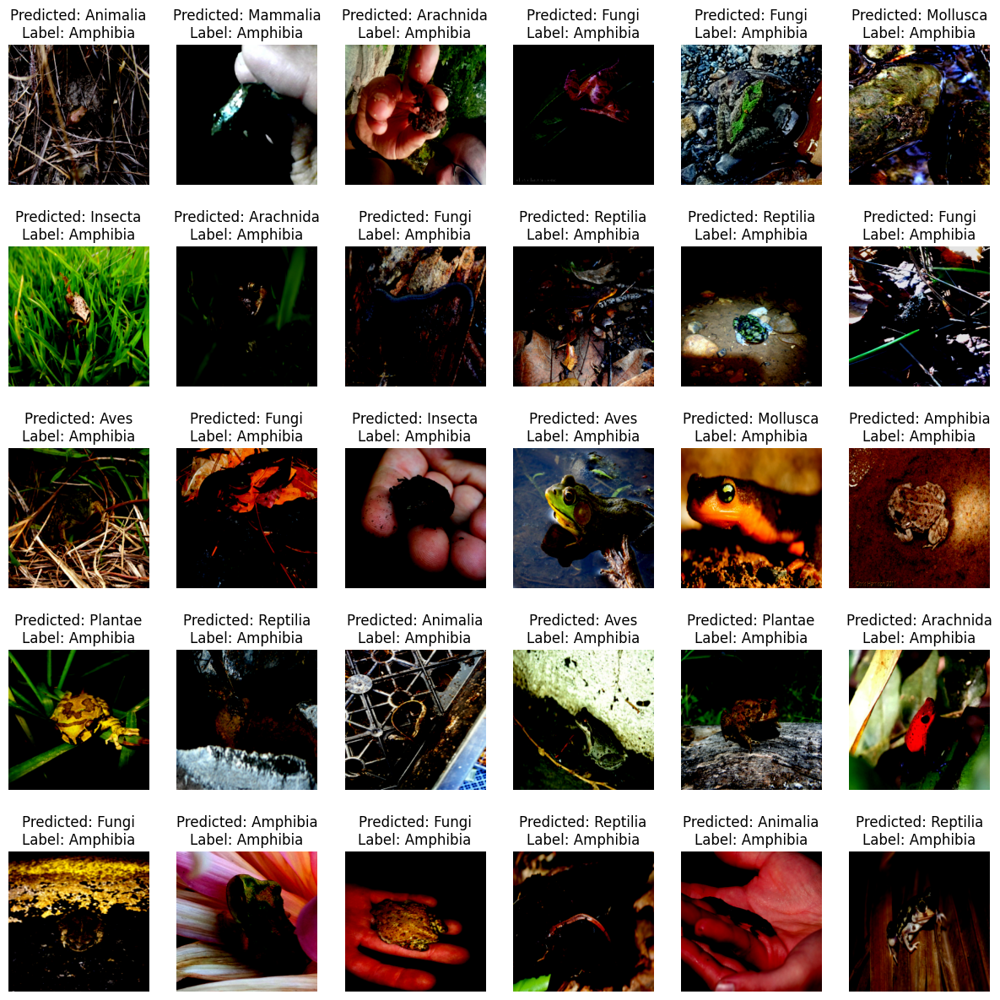

test_accuracy,▁
train_accuracy,▁▇█
train_loss,█▃▁
test_accuracy,23.5
train_accuracy,21.65217
train_loss,2.14001


wandb: Agent Starting Run: takq2n5g with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.001
wandb: 	num_filters: 32


Epoch 1/3 - Loss: 2.2550, Acc: 14.09%
Epoch 2/3 - Loss: 2.2010, Acc: 18.55%
Epoch 3/3 - Loss: 2.1628, Acc: 20.13%


Test Accuracy: 20.80%


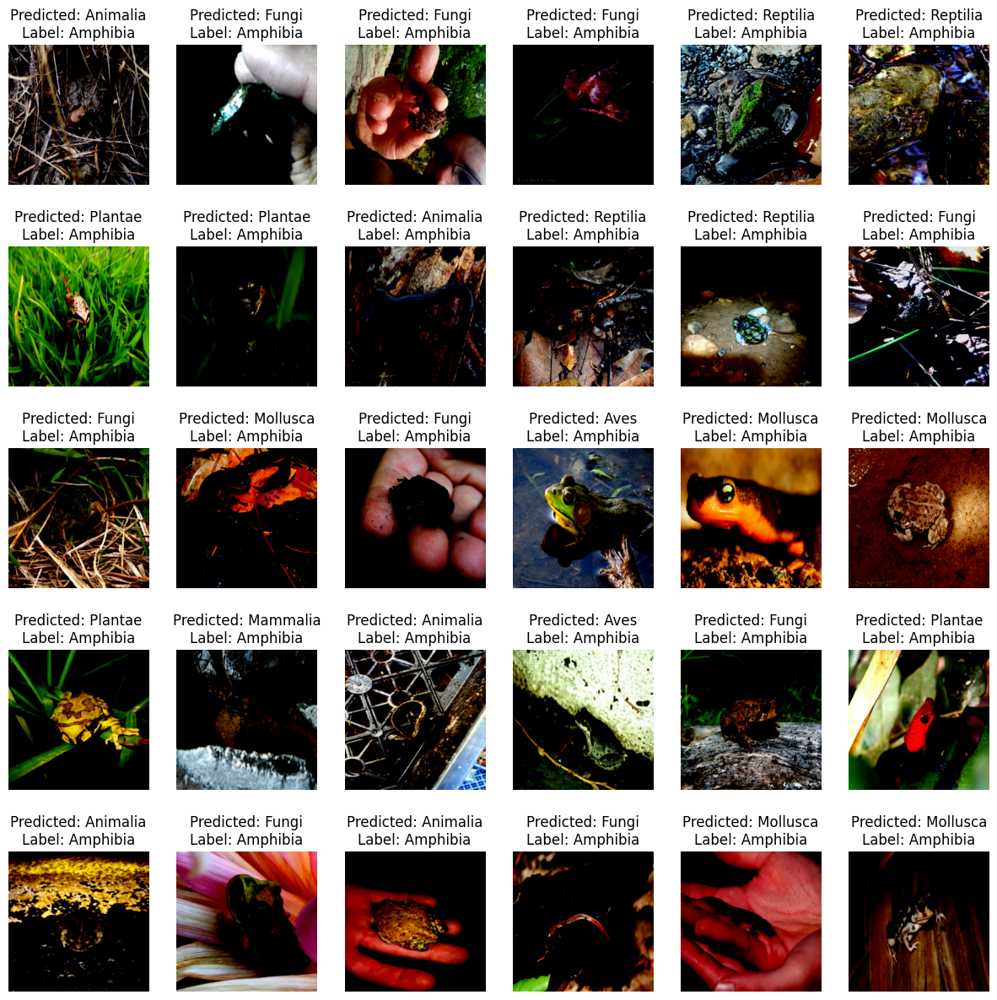

test_accuracy,▁
train_accuracy,▁▆█
train_loss,█▄▁
test_accuracy,20.8
train_accuracy,20.13201
train_loss,2.16278


wandb: Agent Starting Run: vk7ho3tf with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.0001
wandb: 	num_filters: 16


Epoch 1/3 - Loss: 2.2977, Acc: 11.73%
Epoch 2/3 - Loss: 2.2604, Acc: 15.07%
Epoch 3/3 - Loss: 2.2432, Acc: 16.11%


Test Accuracy: 17.65%


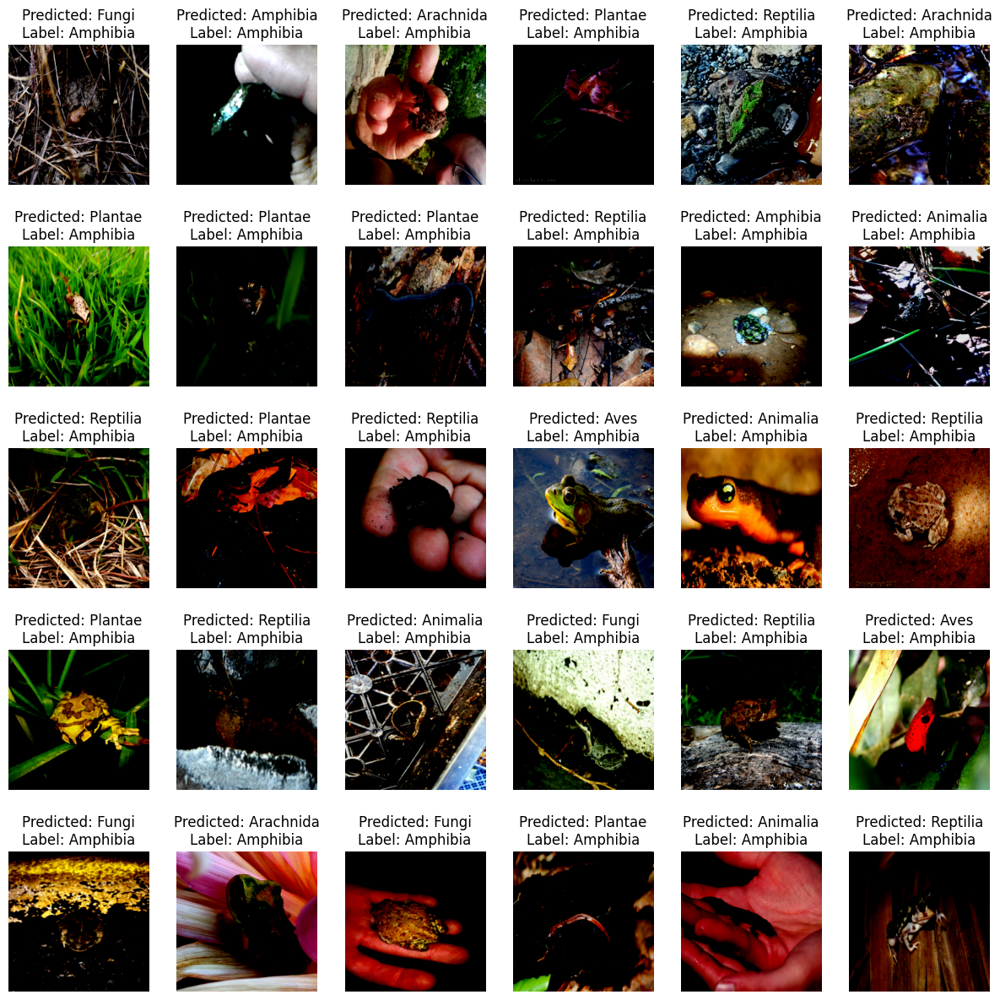

test_accuracy,▁
train_accuracy,▁▆█
train_loss,█▃▁
test_accuracy,17.65
train_accuracy,16.11161
train_loss,2.24318


wandb: Agent Starting Run: xaxhdlfl with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 1
wandb: 	lr: 0.0001
wandb: 	num_filters: 32


Epoch 1/3 - Loss: 2.2862, Acc: 13.35%
Epoch 2/3 - Loss: 2.2462, Acc: 16.73%
Epoch 3/3 - Loss: 2.1868, Acc: 19.76%
Test Accuracy: 22.20%


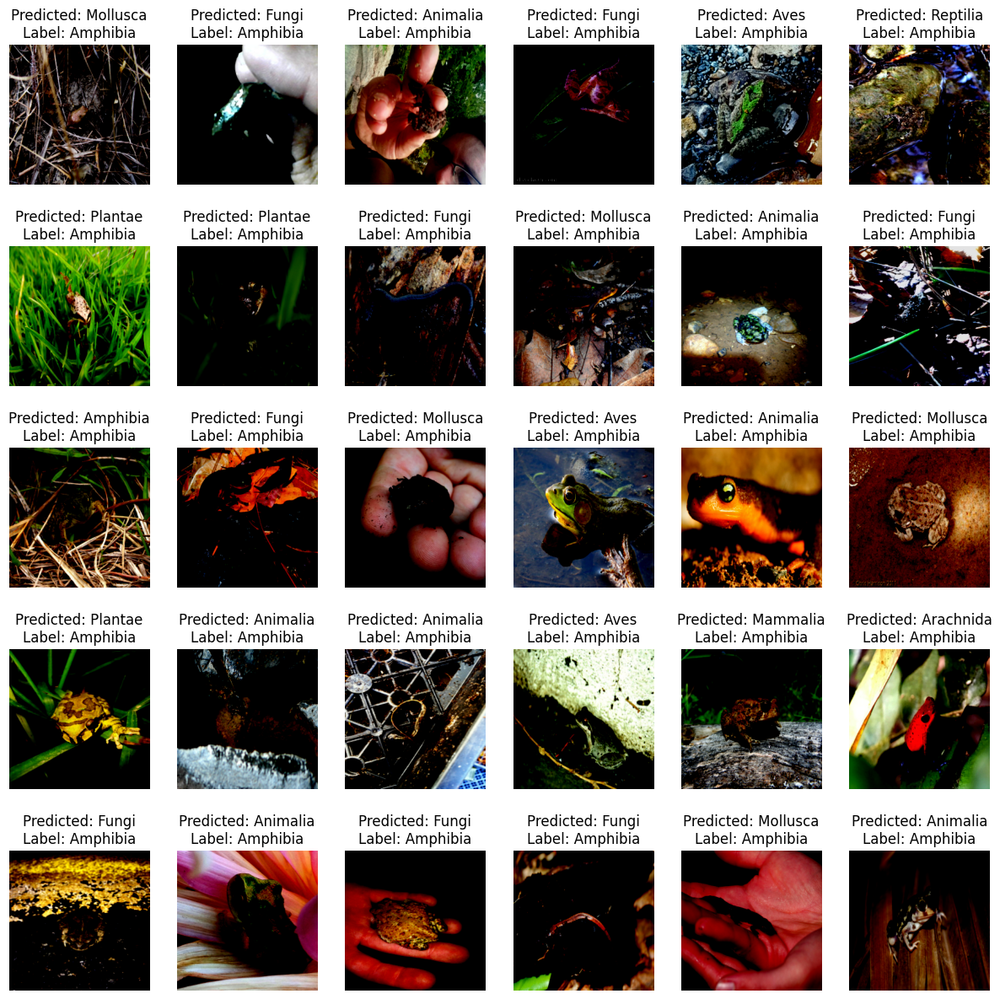

test_accuracy,▁
train_accuracy,▁▅█
train_loss,█▅▁
test_accuracy,22.2
train_accuracy,19.76198
train_loss,2.18675


wandb: Agent Starting Run: 9ec16tnz with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 2
wandb: 	lr: 0.001
wandb: 	num_filters: 16


Epoch 1/3 - Loss: 2.2818, Acc: 12.44%
Epoch 2/3 - Loss: 2.2417, Acc: 16.59%
Epoch 3/3 - Loss: 2.1791, Acc: 20.35%


Test Accuracy: 21.05%


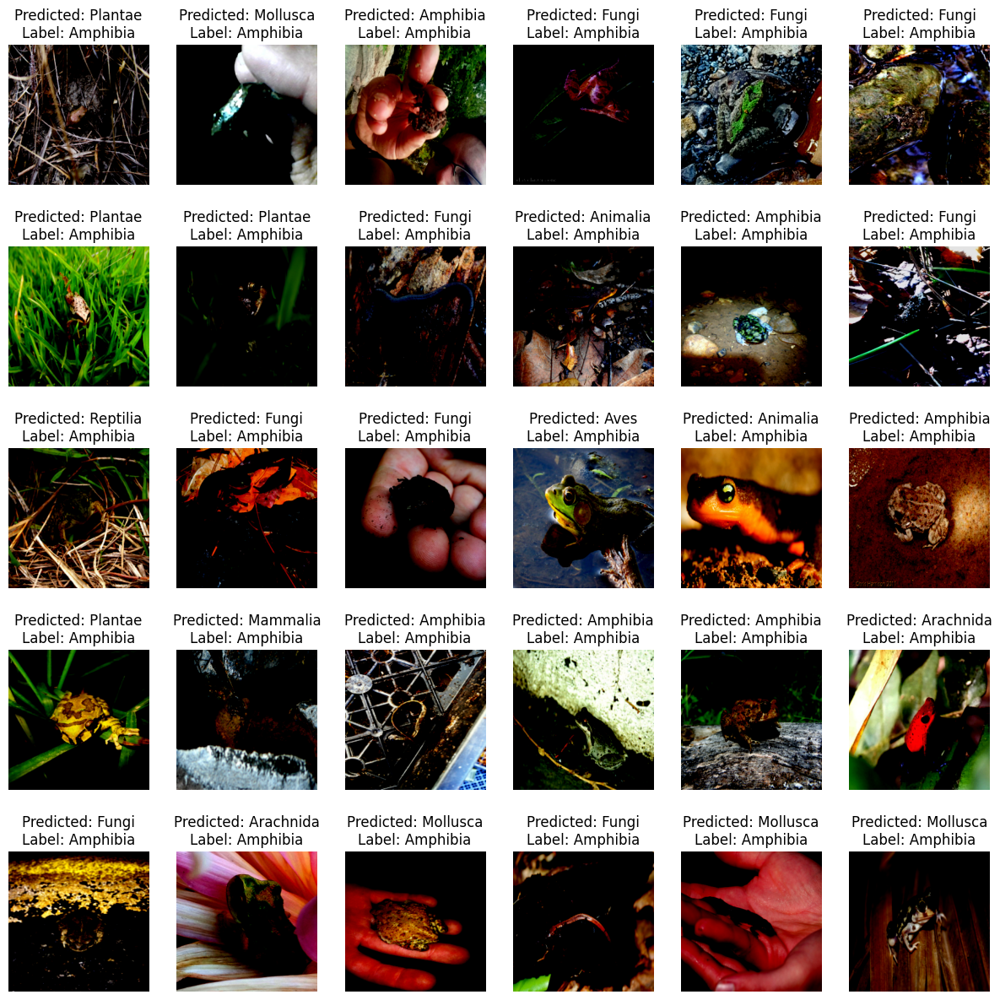

test_accuracy,▁
train_accuracy,▁▅█
train_loss,█▅▁
test_accuracy,21.05
train_accuracy,20.35204
train_loss,2.17907


wandb: Agent Starting Run: kournpv3 with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 2
wandb: 	lr: 0.001
wandb: 	num_filters: 32


Epoch 1/3 - Loss: 2.2658, Acc: 13.37%
Epoch 2/3 - Loss: 2.2226, Acc: 16.84%
Epoch 3/3 - Loss: 2.2054, Acc: 18.42%


Test Accuracy: 19.00%


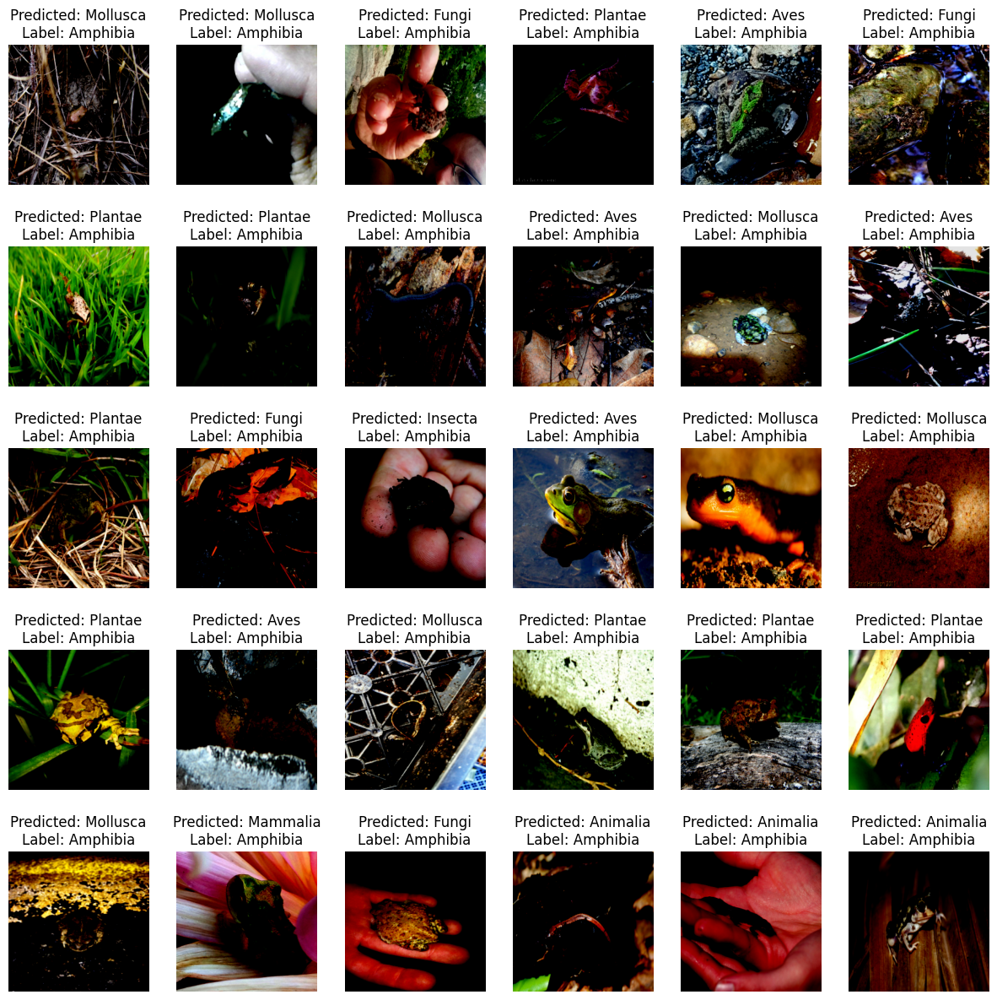

test_accuracy,▁
train_accuracy,▁▆█
train_loss,█▃▁
test_accuracy,19
train_accuracy,18.42184
train_loss,2.20545


wandb: Agent Starting Run: pe1szpao with config:
wandb: 	activation: relu
wandb: 	augment_data: False
wandb: 	batch_norm: False
wandb: 	dense_size: 64
wandb: 	dropout: 0.3
wandb: 	epochs: 3
wandb: 	filter_multiplier: 2
wandb: 	lr: 0.0001
wandb: 	num_filters: 16


In [ ]:

# Function to prepare the test dataset
def prepare_test_dataset(DATA_DIR="inaturalist_12K", augment_data=False, image_size=256, batch_size=30):
    train_dir = os.path.join(DATA_DIR, "train")
    test_dir = os.path.join(DATA_DIR, "val")

    transform_train = transforms.Compose([
        transforms.RandomRotation(90) if augment_data else transforms.Lambda(lambda x: x),
        transforms.RandomResizedCrop(image_size),
        transforms.RandomHorizontalFlip() if augment_data else transforms.Lambda(lambda x: x),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

    transform_test = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

    train_dataset = datasets.ImageFolder(train_dir, transform=transform_train)
    test_dataset = datasets.ImageFolder(test_dir, transform=transform_test)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, test_loader



def log_test_results_to_wandb(images, predictions, labels):
    output_map = {0: 'Amphibia', 1: 'Animalia', 2: 'Arachnida', 3: 'Aves', 4: 'Fungi',
                  5: 'Insecta', 6: 'Mammalia', 7: 'Mollusca', 8: 'Plantae', 9: 'Reptilia'}

    table = wandb.Table(columns=["Image", "Predicted", "Actual"])

    for i in range(len(images)):
        img = images[i]
        img = img * 0.5 + 0.5  # unnormalize
        np_img = img.permute(1, 2, 0).numpy()
        pred_label = output_map[predictions[i]]
        true_label = output_map[labels[i]]
        table.add_data(wandb.Image(np_img), pred_label, true_label)

    wandb.log({"Test Predictions": table})




# Plot test results
def plot_test_results(images, predictions, labels):
    fig, ax = plt.subplots(nrows=5, ncols=6, figsize=(15, 15))
    output_map = {0: 'Amphibia', 1: 'Animalia', 2: 'Arachnida', 3: 'Aves', 4: 'Fungi',
                  5: 'Insecta', 6: 'Mammalia', 7: 'Mollusca', 8: 'Plantae', 9: 'Reptilia'}

    for i in range(30):
        img = images[i].permute(1, 2, 0).cpu().numpy()
        ax[i // 6, i % 6].imshow(img)
        ax[i // 6, i % 6].axis('off')
        ax[i // 6, i % 6].set_title(f"Predicted: {output_map[predictions[i].item()]}\nLabel: {output_map[labels[i].item()]}")
    plt.show()

# Visualize feature maps from the first convolutional layer
def plot_filters(model, image):
    sub_model = nn.Sequential(*list(model.children())[:2])  # Extract first conv layer
    feature_maps = sub_model(image.unsqueeze(0)).detach().cpu().squeeze()
    fig, ax = plt.subplots(4, 8, figsize=(12, 6))
    for i in range(feature_maps.shape[0]):
        ax[i // 8, i % 8].imshow(feature_maps[i], cmap='gray')
        ax[i // 8, i % 8].axis('off')
    plt.show()

# Function to set run name
def set_run_name(num_filters, filter_multiplier, augment_data, dropout, batch_norm):
    return f"num_{num_filters}_org_{filter_multiplier}_aug_{augment_data}_drop_{dropout}_norm_{batch_norm}"

# Define test function
def test():
    config_defaults = {
        "num_filters": 32,
        "filter_multiplier": 2,
        "augment_data": False,
        "dropout": 0.3,
        "batch_norm": False,
        "epochs": 3,
        "dense_size": 64,
        "activation": "relu",
        "lr": 0.001
    }

    wandb.init(config=config_defaults, project="CNN-Test")
    config = wandb.config
    wandb.run.name = set_run_name(config.num_filters, config.filter_multiplier, config.augment_data, config.dropout, config.batch_norm)

    train_loader,test_loader = prepare_test_dataset(augment_data=config.augment_data, image_size=256)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = CNNClassifier(
                    num_filters=config.num_filters,
                    filter_multiplier=config.filter_multiplier,
                    dropout=config.dropout,
                    batch_norm=config.batch_norm,
                    dense_size=config.dense_size,
                    num_classes=10).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=config.lr)

    # Train the model
    model.train()
    for epoch in range(config.epochs):
        running_loss, correct, total = 0.0, 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
        train_loss = running_loss / len(train_loader)
        train_acc = 100. * correct / total
        wandb.log({"train_loss": train_loss, "train_accuracy": train_acc})
        print(f"Epoch {epoch+1}/{config.epochs} - Loss: {train_loss:.4f}, Acc: {train_acc:.2f}%")

    # Evaluate
    correct, total = 0, 0
    all_preds = []
    all_labels = []
    all_images = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)


            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_images.extend(images.cpu())


    accuracy = 100. * correct / total
    print(f"Test Accuracy: {accuracy:.2f}%")
    wandb.log({"test_accuracy": accuracy})

    # Visualize first 30 predictions
    plot_test_results(all_images[:30], all_preds[:30], all_labels[:30])

    # log_filters_to_wandb(all_images[:30], all_preds[:30], all_labels[:30])
    log_test_results_to_wandb(all_images[:30], all_preds[:30], all_labels[:30])

sweep_config = {
    'method': 'bayes',
    'metric': {
        'name': 'test_accuracy',
        'goal': 'maximize'
    },
    'parameters': {
        'num_filters': {
            'values': [16, 32]
        },
        'filter_multiplier': {
            'values': [1, 2]
        },
        'augment_data': {
            'values': [False, True]
        },
        'dropout': {
            'values': [0.3, 0.5]
        },
        'batch_norm': {
            'values': [False, True]
        },
        'epochs': {
            'value': 3
        },
        'dense_size': {
            'values': [64, 128]
        },
        'activation': {
            'values': ['relu']
        },
        'lr': {
            'values': [0.001, 0.0001]
        }
    }
}
if __name__ == "__main__":
    sweep_id = wandb.sweep(sweep_config, project="CNN-Test")
    wandb.agent(sweep_id, function=test, count=10)

